                                                                                                                    SBC - GIA
___

<div style="text-align: center;">
    <span style="font-family: 'Playfair Display', serif; font-size: 24px; font-weight: bold;">
        Feature Decisions
    </span>
</div>

___


In this notebook, our objective is to perform an exploration of the dataset. To create a manual decision tree, we'll closely examine the `DecisionTreeClassifier` to identify patterns that can guide us in selecting the hierarchical variables. Additionally, we'll conduct a feature analysis to validate our findings and assess the results.


**Index**

- Dataset Review.
    - Clustering Analysis.
    - Apply Hierarchical Clustering.

##### Installations and Imports

In [1]:
#!pip install seaborn
#!pip install -U kaleido

import os
import json
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import re
import seaborn as sns

import sklearn
from random import randint
from sklearn import tree
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier, export_text, export_graphviz

#import graphviz
import plotly.express as px
import plotly.graph_objects as go

<div style="background-color:#F2F2F2; padding: 10px;">
    <div style="text-align: center;">
        <span style="font-family: 'Playfair Display', serif; font-size: 20px; font-weight: bold;">
            1. Dataset Review
        </span>     
    </div>
</div>

In this section, we focus on loading the dataset and conducting a preliminary examination. 

It's worth mentioning that we are utilizing the dataset provided by the `Tractament_Ontologia.ipynb` notebook, which has been preprocessed and transformed into dummy variables. This dataset will serve as the foundation for our analysis in this notebook.

In [2]:
#Load .csv dataset (dummies)
df_model = pd.read_csv('casos_lectors_dummies.csv')
df_model.head()

,id_usuari,llibre_recomanat,score,any_naixement,Comedia,Historica,Romance,Ciencia_Ficcio,Ficcio,Fantasia,...,pref_adaptacio_peli_No,pref_adaptacio_peli_Si,pref_best_seller_No,pref_best_seller_Si,genere_persona_altres,genere_persona_dona,genere_persona_home,pref_sagues_Indiferent,pref_sagues_No,pref_sagues_Si
0,0,Conversations_with_Friends,5,2003,1,1,1,1,1,0,...,0,1,1,0,0,1,0,0,1,0
1,0,The_song_of_Achiles,5,2003,1,1,1,1,1,0,...,0,1,1,0,0,1,0,0,1,0
2,0,Los_Juegos_del_Hambre,5,2003,1,1,1,1,1,0,...,0,1,1,0,0,1,0,0,1,0
3,0,Pride_and_Prejudice,5,2003,1,1,1,1,1,0,...,0,1,1,0,0,1,0,0,1,0
4,0,Un_cuento_Perfecto,5,2003,1,1,1,1,1,0,...,0,1,1,0,0,1,0,0,1,0


Upon reviewing the dataset, we observe that it comprises the following columns, each representing distinct data attributes:

|   COLUMS             |            DATASET   |
|----------------------|---------------------------|
| id_usuari            | Densa                     | 
| llibre_recomanat     |Fluida                     | 
| score                |pagines_max                | 
| any_naixement        |pref_adaptacio_peli_No     |  
| Comedia              |pref_adaptacio_peli_Si     |  
| Historica            |pref_best_seller_No        | 
| Romance              | pref_best_seller_Si       |  
| Ciencia_Ficcio       |genere_persona_altres      |
| Ficcio               |genere_persona_dona        | 
| Fantasia             | genere_persona_home       | 
| Ciencia              | pref_sagues_Indiferen     | 
| Creixement_personal  |  pref_sagues_No           |   
| Autoajuda            | pref_sagues_Si            |   
| Policiaca            |        Juveni             |    

#### Clustering Analysis

This section is based in: 

- Remove redundant variables.
- Remove the `id_usuari` as this allows us to eliminate potential "correlations" that the clustering method might find between different cases based on numerical proximity by user_id (which makes no sense).
    -  Cases referring to the same user will be similar or identical based on the rest of the attributes.

In [3]:
df_model.columns

Index(['id_usuari', 'llibre_recomanat', 'score', 'any_naixement', 'Comedia',
       'Historica', 'Romance', 'Ciencia_Ficcio', 'Ficcio', 'Fantasia',
       'Ciencia', 'Creixement_personal', 'Autoajuda', 'Policiaca', 'Juvenil',
       'Densa', 'Fluida', 'pagines_max', 'pref_adaptacio_peli_No',
       'pref_adaptacio_peli_Si', 'pref_best_seller_No', 'pref_best_seller_Si',
       'genere_persona_altres', 'genere_persona_dona', 'genere_persona_home',
       'pref_sagues_Indiferent', 'pref_sagues_No', 'pref_sagues_Si'],
      dtype='object')

In [4]:
X = df_model.drop(['score','llibre_recomanat','id_usuari','genere_persona_altres','pref_adaptacio_peli_No',
                   'pref_best_seller_No','pref_sagues_Indiferent'], axis=1) 

y = df_model['llibre_recomanat']

# Preprocessing
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

#### Apply Hierarchical Clustering

- We perform a clustering method (in this case, hierarchical) that allows grouping the cases in the case base into similarity groups based on the measure of Euclidean distance similarity between attributes.

- The validation of the clustering will be made by applying a visual validation using PCA (reduces the dimensionality).

In [5]:
clustering = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='ward')
labels = clustering.fit_predict(X_scaled)

# PCA
pca = PCA(n_components=3)
pca_result = pca.fit_transform(X_scaled)

# Create a DataFrame with the main 3 components; these are the latent components that explain the variance percentage
result_df = pd.DataFrame({'PC1': pca_result[:, 0], 'PC2': pca_result[:, 1], 'PC3': pca_result[:, 2], 'Cluster': labels})

# Add attributes from the original case-base to this one so that the final plot is even
# more informative and allows for better analysis.
result_df = pd.concat([result_df, X.reset_index(drop=True)], axis=1)

# Add information about the percentage of explained variance
labels2 = {f"PC {i+1}": f"{var:.1f}%"
           for i, var in enumerate(pca.explained_variance_ratio_ * 100)
           }

# Amount of variance explained by each component
labels2

{'PC 1': '16.8%', 'PC 2': '11.8%', 'PC 3': '10.4%'}

The PCA results reveal that the first principal component (PC1) accounts for 14.4% of the dataset's total variance, highlighting its significance as the most informative component. 

The second and third principal components, PC2 and PC3, contribute 11.7% and 10.9% respectively, indicating a notable but lesser extent of information capture compared to PC 1. 

Together, these three components explain approximately 37% of the overall variance. This suggests that while they encapsulate a substantial portion of the data's structure, a significant amount of variance remains unaccounted for, indicating the potential need for additional components or complementary analytical techniques to fully understand the dataset's complexity.

<div style="background-color:#F2F2F2; padding: 10px;">
    <div style="text-align: center;">
        <span style="font-family: 'Playfair Display', serif; font-size: 20px; font-weight: bold;">
            2. Visualitzation
        </span>     
    </div>
</div>

In this section, we visualize a 3D scatter plot that displays three dimensions of Principal Component Analysis (PCA). Additionally, we use a cumulative explained variance plot to understand how many components capture most of the data's variance 

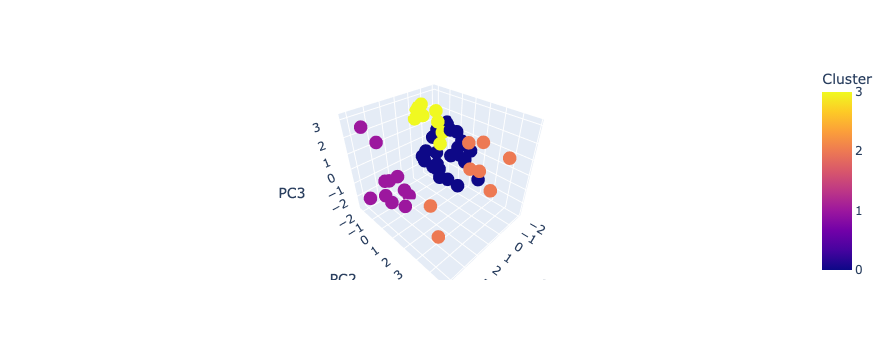

In [6]:
fig = px.scatter_3d(result_df, x='PC1', y='PC2', z='PC3', color='Cluster', labels = labels, hover_data=result_df.columns[4:])
fig.show()

The code provided calculates the cumulative explained variance and creates an area plot to help us determine the optimal number of components for dimensionality reduction.

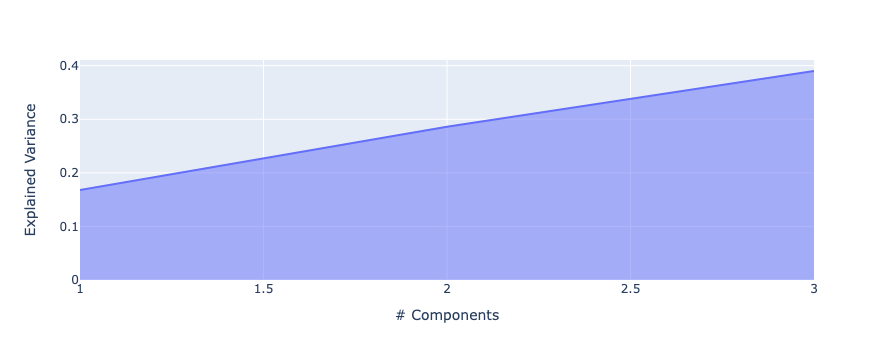

In [7]:
exp_var_cumul = np.cumsum(pca.explained_variance_ratio_)

px.area(
    x=range(1, exp_var_cumul.shape[0] + 1),
    y=exp_var_cumul,
    labels={"x": "# Components", "y": "Explained Variance"}
)

In the previous plot, we can also include what are known as **loadings**. 

Loadings are vector representations of the original variables in the reduced-dimensional space. They provide insights into the "importance" of each original variable in the new, reduced-dimensional space, meaning each component. This allows us to understand how each variable contributes to the overall structure of the reduced-dimensional data for the first two dimensions.

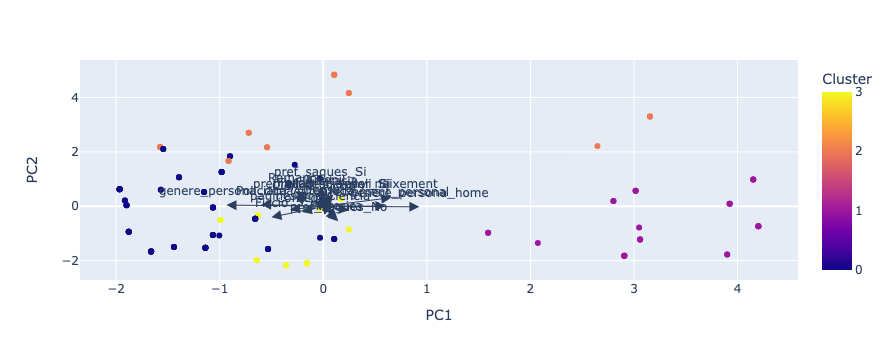

In [8]:
# Dimentions PC1-PC2
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
fig = px.scatter(result_df, x='PC1', y='PC2', color='Cluster')

for i, feature in enumerate(list(X.columns)):
    fig.add_annotation(
        ax=0, ay=0,
        axref="x", ayref="y",
        x=loadings[i, 0],
        y=loadings[i, 1],
        showarrow=True,
        arrowsize=2,
        arrowhead=2,
        xanchor="right",
        yanchor="top"
    )
    fig.add_annotation(
        x=loadings[i, 0],
        y=loadings[i, 1],
        ax=0, ay=0,
        xanchor="center",
        yanchor="bottom",
        text=feature,
        yshift=5,
    )
fig.show()

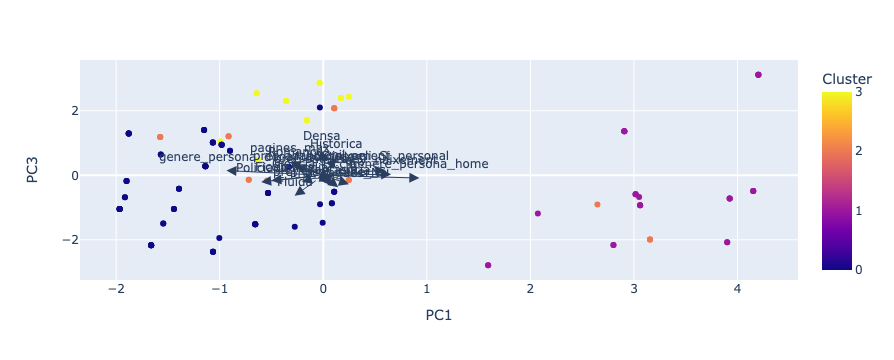

In [9]:
# Dimentions PC1-PC3
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
fig = px.scatter(result_df, x='PC1', y='PC3', color='Cluster')

for i, feature in enumerate(list(X.columns)):
    fig.add_annotation(
        ax=0, ay=0,
        axref="x", ayref="y",
        x=loadings[i, 0],
        y=loadings[i, 2],
        showarrow=True,
        arrowsize=2,
        arrowhead=2,
        xanchor="right",
        yanchor="top"
    )
    fig.add_annotation(
        x=loadings[i, 0],
        y=loadings[i, 2],
        ax=0, ay=0,
        xanchor="center",
        yanchor="bottom",
        text=feature,
        yshift=5,
    )
fig.show()

If we zoom in, we can observe that the features with the most importance in the first principal component (PCA1) are:

1. Gender of the individual
2. Year of birth

For PCA2, the most important features are:

1. User's preferred genre set
2. Book specifications

This information helps us understand which variables have the most influence in these specific principal components, shedding light on the underlying patterns within the data.


We can calculate the L2 norm of these loading vectors, which quantifies the extent to which each variable is important or not. We will use this information to compare it with what different decision trees generate and thus further justify the preference in attribute splits. This will allow us to assess how variables impact the structure of decision trees and support our attribute selection choices in the decision-making process.

In [10]:
norma_2 = {}
for i, feature in enumerate(list(X.columns)):
    norma_2[feature] = float((loadings[i, 0]**2+loadings[i, 1]**2+loadings[i, 2]**2)**(1/2))
norma_2

{'any_naixement': 0.7281474027412388,
 'Comedia': 0.36229133633510263,
 'Historica': 0.7552246139340715,
 'Romance': 0.6629415240725682,
 'Ciencia_Ficcio': 0.26540985231967174,
 'Ficcio': 0.6646018707615113,
 'Fantasia': 0.5126313519902066,
 'Ciencia': 0.40183332420554074,
 'Creixement_personal': 0.6211563841115899,
 'Autoajuda': 0.13136192311347616,
 'Policiaca': 0.6366406249292809,
 'Juvenil': 0.49443701982975724,
 'Densa': 0.7794798053356824,
 'Fluida': 0.7721956087640661,
 'pagines_max': 0.5362442142511761,
 'pref_adaptacio_peli_Si': 0.3436556012208466,
 'pref_best_seller_Si': 0.4525205041291609,
 'genere_persona_dona': 0.9473590598907026,
 'genere_persona_home': 0.9321062734770346,
 'pref_sagues_No': 0.685540767904113,
 'pref_sagues_Si': 0.7328650756302176}

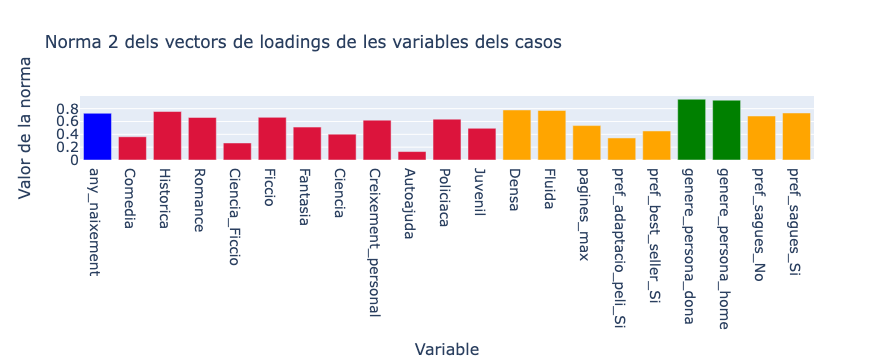

In [11]:
# Plot the results
colors = ['blue',] * len(list(X.columns))
colors[1:11] = ['crimson',]*11
colors[12:18] = ['orange',]*7
colors[17:19] = ['green',]*3
colors[19:] = ['orange',]*3

fig = go.Figure(data=[go.Bar(
    x=[i for i,j in norma_2.items()],
    y=[j for i,j in norma_2.items()],
    marker_color=colors # marker color can be a single color value or an iterable
)])
fig.update_layout(title_text="Norma 2 dels vectors de loadings de les variables dels casos",yaxis=dict(
        title='Valor de la norma',
        titlefont_size=16,
        tickfont_size=14,
    ),xaxis=dict(
        title='Variable',
        titlefont_size=16,
        tickfont_size=14,
    ))
fig.show()

With this information, we proceed to implement the Decision Tree Classifier algorithm. In this case, our target labels are the cluster values for each case. This approach allows the algorithm to minimize impurity (entropy) by seeking splits that separate the data with the least entropy concerning the cluster values of the separated cases. In other words, we aim to separate the cases into clusters in a way that minimizes the number of represented clusters at each branching point, effectively minimizing entropy.

In [12]:
X_tree = result_df.drop(['PC1','PC2','PC3','Cluster'], axis=1) 
y_tree = result_df['Cluster']

dt = DecisionTreeClassifier(criterion='entropy',random_state=61) #Volem que s'ajusti el màxim possible a les dades
dt.fit(X_tree,y_tree)

DecisionTreeClassifier(criterion='entropy', random_state=61)

In [13]:
dt.feature_importances_

array([0.        , 0.        , 0.07330047, 0.06419225, 0.06584996,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.1446557 , 0.        ,
       0.        , 0.        , 0.39125533, 0.        , 0.        ,
       0.26074629])

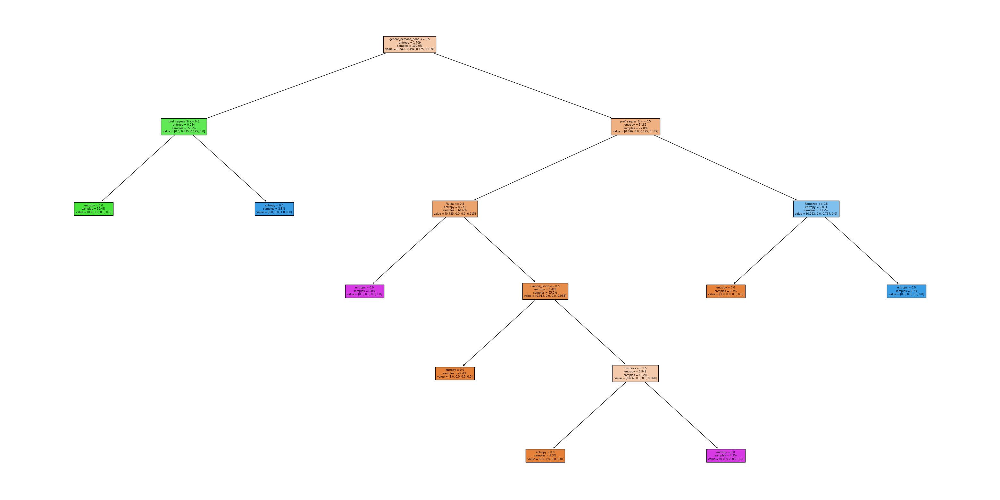

In [14]:
plt.figure(figsize=(40,20))
tree.plot_tree(dt,feature_names = list(X_tree.columns), filled = True, proportion = True, fontsize=6)
plt.savefig('tree_high_dpi_61', dpi=100)

In the following code, we perform the following operations:

1. We set up an empty dictionary called `accum_fi` to store the cumulative feature importance values.

2. We run a loop for 20 iterations:
   - Within each iteration, we select a random `random_state` value.
   - We train a Decision Tree Classifier using this random state for introducing randomness.
   - We create a bar plot displaying feature importances and save it as an HTML file.
   - We accumulate the feature importance values into the `accum_fi` dictionary.

3. Additionally, we visualize and save the decision tree for each iteration, making it easier to analyze the decision tree structures.

This process enables us to examine how feature importances and decision tree structures vary across different random states, contributing to a more comprehensive analysis.

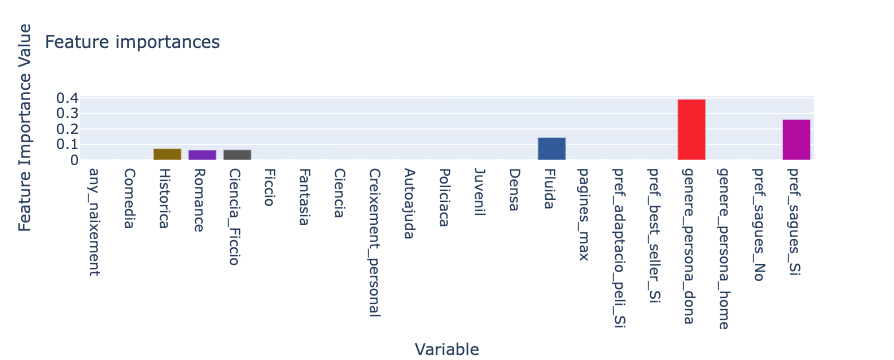

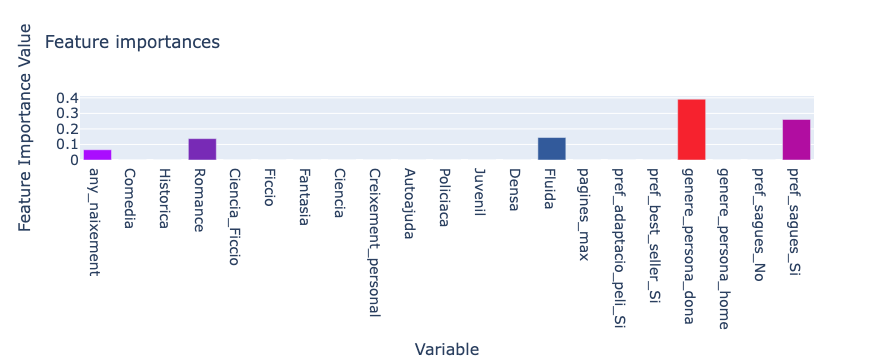

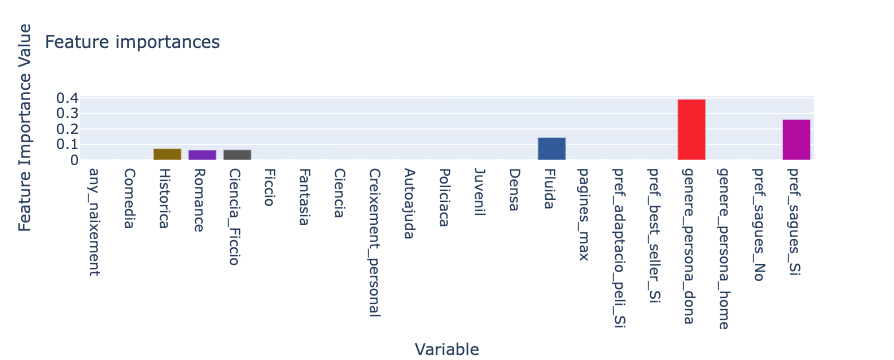

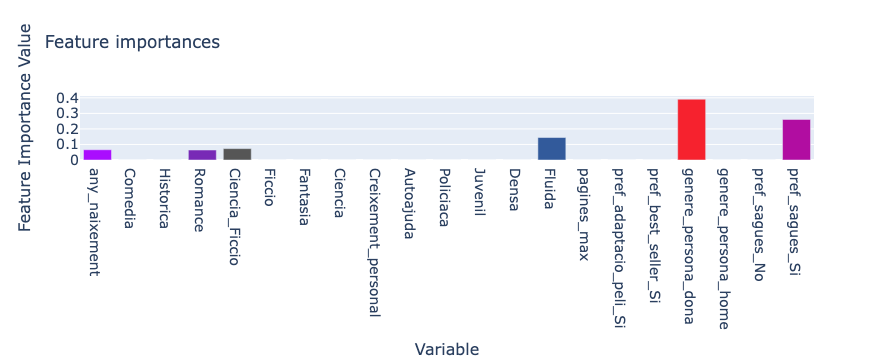

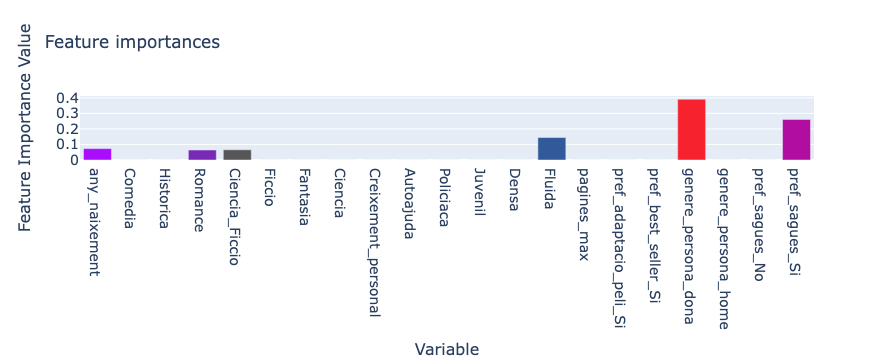

...

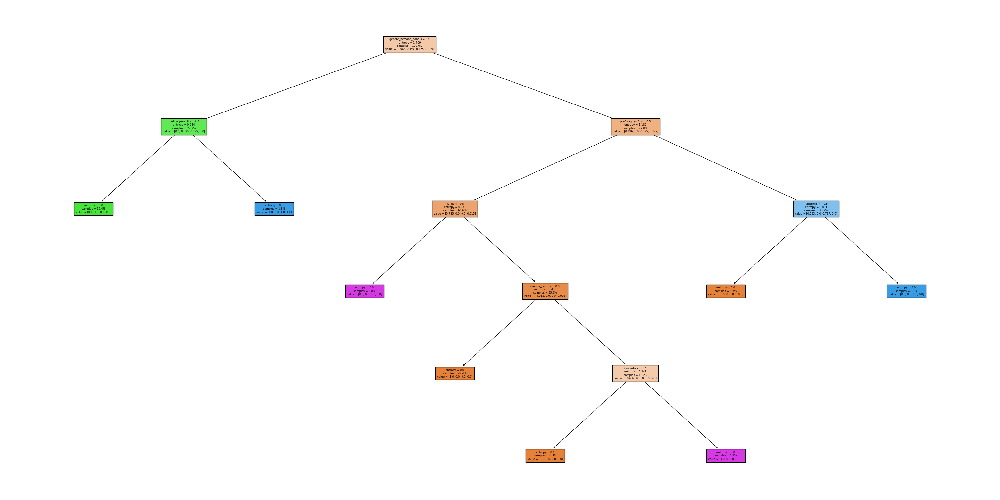

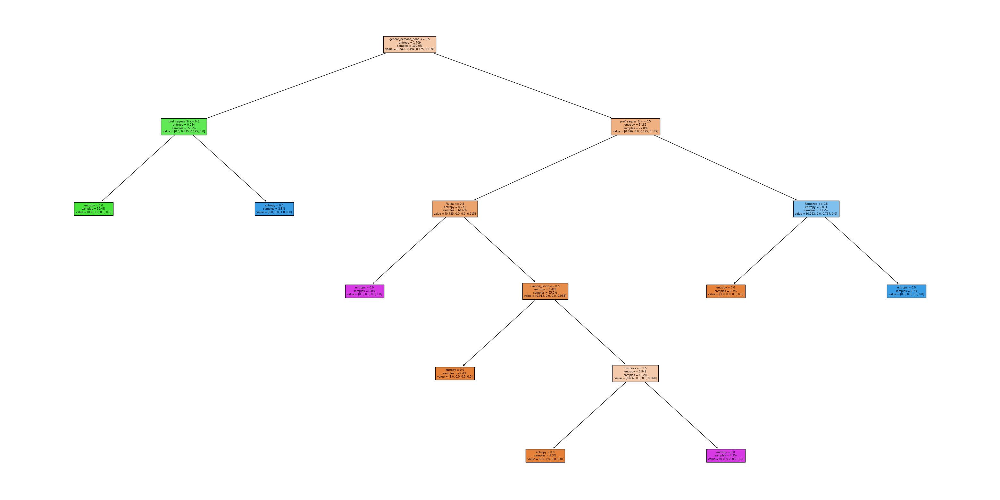

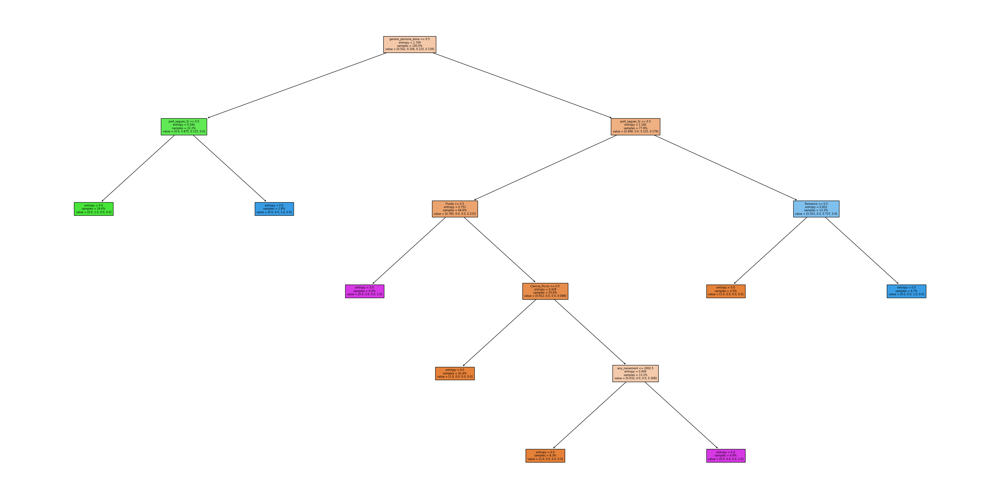

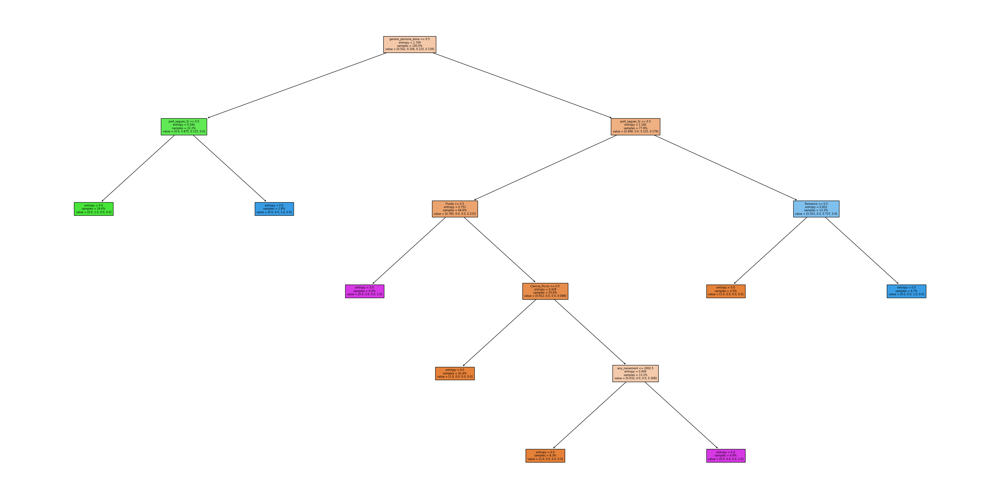

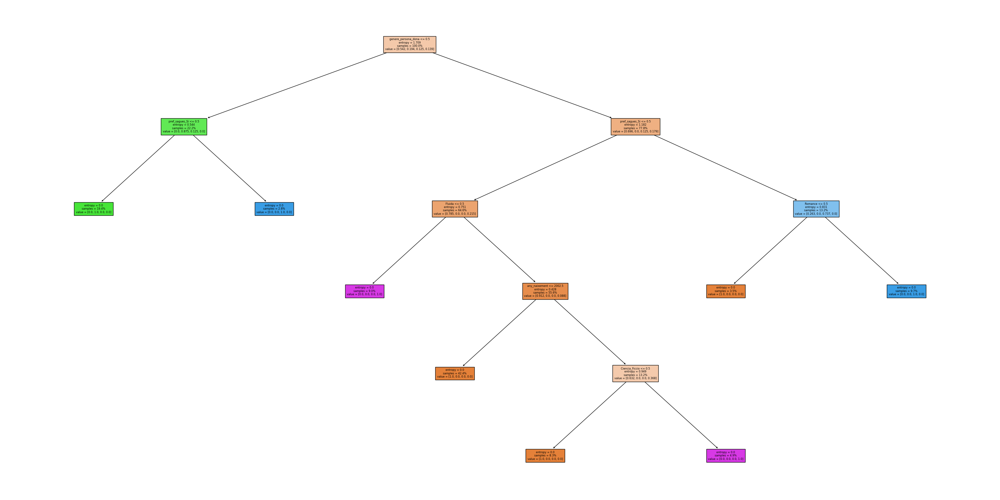

In [15]:
PATH_FILE = '../Code/Images'
if not os.path.exists(PATH_FILE):
    os.makedirs(PATH_FILE)
    
accum_fi = {i:[] for i in list(X_tree.columns)}  # To accumulate the values of feature importances

for i in range(20):
    # Select a random value
    random_state = randint(0,1000)
    
    # Train a tree with that random value as the random_state
    dt = DecisionTreeClassifier(criterion='entropy', random_state=random_state) # We want it to fit the data as closely as possible
    dt.fit(X_tree, y_tree)
    
    # Plot the feature_importances_ and save it
    fig = go.Figure(data=[go.Bar(
    x=list(X_tree.columns),
    y=dt.feature_importances_,
    marker_color=px.colors.qualitative.Alphabet[0:len(X_tree.columns)] # marker color can be a single color value or an iterable
    )])
    fig.update_layout(title_text="Feature importances", yaxis=dict(
            title='Feature Importance Value',
            titlefont_size=16,
            tickfont_size=14,
        ), xaxis=dict(
            title='Variable',
            titlefont_size=16,
            tickfont_size=14,
        ))
    fig.show()
    fig.write_html(os.path.join(PATH_FILE, f"feature_importances_{random_state}.html"))
    
    # Accumulate the feature importances in the dictionary
    for j in range(len(X_tree.columns)):
        accum_fi[X_tree.columns[j]].append(dt.feature_importances_[j])
    
    plt.figure(figsize=(40,20))
    tree.plot_tree(dt, feature_names=list(X_tree.columns), filled=True, proportion=True, fontsize=6)
    plt.savefig(os.path.join(PATH_FILE, f"tree_{random_state}.png"), dpi=100)

# Also save the accumulated results in the feature importances dictionary
with open('feature_importances_dict.json', 'w') as f:
    json.dump(accum_fi, f)

In [16]:
X_tree.columns

Index(['any_naixement', 'Comedia', 'Historica', 'Romance', 'Ciencia_Ficcio',
       'Ficcio', 'Fantasia', 'Ciencia', 'Creixement_personal', 'Autoajuda',
       'Policiaca', 'Juvenil', 'Densa', 'Fluida', 'pagines_max',
       'pref_adaptacio_peli_Si', 'pref_best_seller_Si', 'genere_persona_dona',
       'genere_persona_home', 'pref_sagues_No', 'pref_sagues_Si'],
      dtype='object')

Finally, we visualize a bar chart that represents each of the variables alongside their average feature importance values calculated over the course of 20 experiments with different initializations. 

Additionally, we display the standard deviation (error) in this chart. This provides a more robust view of the results as it encompasses the outcomes from 20 replicates, helping us to understand the significance of the feature importance estimates across different runs.

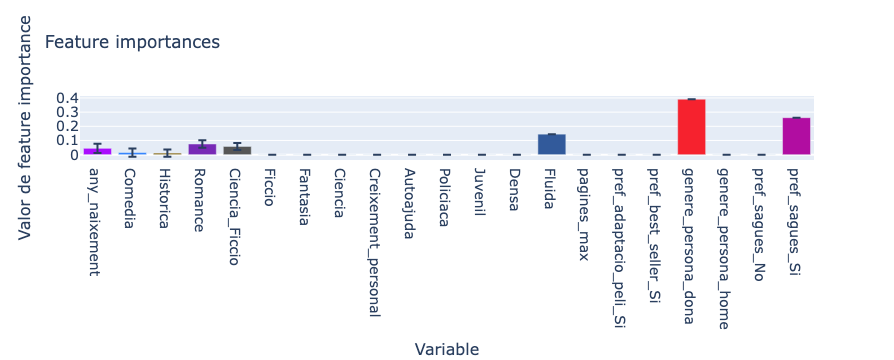

In [17]:
# Calculem les mitjanes
mu = [np.mean(value) for key,value in accum_fi.items()]
std = [np.std(value) for key,value in accum_fi.items()]

fig2 = go.Figure()
fig2.add_trace(go.Bar(
    x=list(X_tree.columns), y=mu,
    error_y=dict(type='data', array=std),
    marker_color=px.colors.qualitative.Alphabet[0:len(X_tree.columns)]
))
fig2.update_layout(title_text="Feature importances",yaxis=dict(
            title='Valor de feature importance',
            titlefont_size=16,
            tickfont_size=14,
        ),xaxis=dict(
            title='Variable',
            titlefont_size=16,
            tickfont_size=14,
        ))
fig2.show()
fig2.write_html(f"feature_importances_robust.html")

In [18]:
# List of tuples containing the name of the feature and its importance
feature_importance_tuples = [(feature, importance) for feature, importance in zip(X_tree.columns, mu)]
sorted_feature_importance_tuples = sorted(feature_importance_tuples, key=lambda x: x[1], reverse=True)

# Obtain a list of sorted feature names
sorted_feature_names = [feature for feature, _ in sorted_feature_importance_tuples]
sorted_feature_names

['genere_persona_dona',
 'pref_sagues_Si',
 'Fluida',
 'Romance',
 'Ciencia_Ficcio',
 'any_naixement',
 'Comedia',
 'Historica',
 'Ficcio',
 'Fantasia',
 'Ciencia',
 'Creixement_personal',
 'Autoajuda',
 'Policiaca',
 'Juvenil',
 'Densa',
 'pagines_max',
 'pref_adaptacio_peli_Si',
 'pref_best_seller_Si',
 'genere_persona_home',
 'pref_sagues_No']

---
---